In [35]:
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.utils as vutils
import torchvision.models as models
from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d

import matplotlib.pyplot as plt
import numpy as np
import random
import os
import glob
import time
import PIL

import warnings
warnings.filterwarnings('ignore')

In [36]:
# Root directory for dataset
dataroot = "/content/drive/My Drive/lego-faces-label"
lego_images=glob.glob(dataroot+"/data/*")

np.random.seed(1234)
torch.manual_seed(1234)
random.seed(1234)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

BATCH_SIZE  = 64
N_EPOCHS = 500
IMAGE_SIZE = 64
LATENT_DIM = 100
N_LABEL = 4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [37]:
class legoDataset(torch.utils.data.Dataset):
    
    def __init__(self, lego_images, transform):
        self.lego_images=lego_images
        self.transform=transform
        
    def __getitem__(self,index):
        
        impathglobal=self.lego_images[index]
        image= PIL.Image.open(impathglobal)
        impathlocal = impathglobal.split("/")[-1]
        temp = impathlocal.split("-")[0]
        
        #Possible labels are {"bald":0, "hair":1, "hat":2, "helmet":3} 
        label=torch.zeros(4)
        label[int(temp)]=1
        
        return self.transform(image),label
        
    def __len__(self):
        return len(self.lego_images)

label BALD - 0


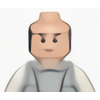

In [38]:
print("label BALD - 0")
from IPython.display import Image
Image(filename=dataroot+'/data/0-lego409.png') 

label HAIR - 1


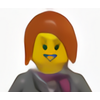

In [39]:
print("label HAIR - 1")
from IPython.display import Image
Image(filename=dataroot+'/data/1-lego1161.png') 

label HAT - 2


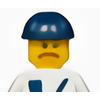

In [40]:
print("label HAT - 2")
from IPython.display import Image
Image(filename=dataroot+'/data/2-lego1072.png') 

label HELMET - 3


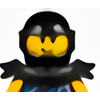

In [41]:
print("label HELMET - 3")
from IPython.display import Image
Image(filename=dataroot+'/data/3-lego105.png')

In [42]:
transform=transforms.Compose([
                                   transforms.Resize(IMAGE_SIZE),
                                   transforms.CenterCrop(IMAGE_SIZE),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                               ])

dataset=legoDataset(lego_images, transform)

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE,
                                         shuffle=True)

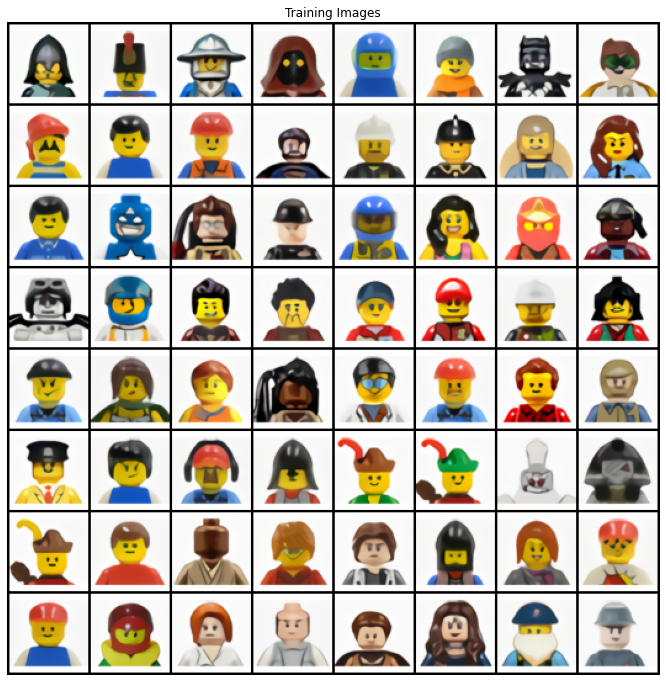

In [43]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))

In [44]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [45]:
class Generator(nn.Module):
    def __init__(self, latent_dim, image_size, n_label):
        super(Generator, self).__init__()
        self.ylabel=nn.Sequential(
            nn.Linear(4,100),
            nn.ReLU(True)
        )
        
        self.noise=nn.Sequential(
            nn.Linear(100,200),
            nn.ReLU(True)
        )
        
        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_channels=300, 
                               out_channels=image_size*8, 
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            nn.BatchNorm2d(image_size*8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=image_size*8, 
                               out_channels=image_size*4, 
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size*4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=image_size*4, 
                               out_channels=image_size*2, 
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size*2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=image_size*2, 
                               out_channels=image_size, 
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=image_size, 
                               out_channels=3, 
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            
            nn.Tanh()
            
        )

    def forward(self, z,y):
        
        #mapping noise and labe
        z=self.noise(z)
        y=self.ylabel(y)
        
        #mapping concatenated input to the main generator network
        inp=torch.cat([z,y],1)
        inp=inp.view(-1,300,1,1)
        output = self.main(inp)

        return output
    
G = Generator(LATENT_DIM, IMAGE_SIZE, N_LABEL).to(device)
G.apply(weights_init)

Generator(
  (ylabel): Sequential(
    (0): Linear(in_features=4, out_features=100, bias=True)
    (1): ReLU(inplace=True)
  )
  (noise): Sequential(
    (0): Linear(in_features=100, out_features=200, bias=True)
    (1): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): ConvTranspose2d(300, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (

In [46]:
class Discriminator(nn.Module):
    def __init__(self, image_size, n_label):
        super(Discriminator, self).__init__()
            
        self.ylabel=nn.Sequential(
            nn.Linear(n_label,64*64*1),
            nn.ReLU(True)
        )
        
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(in_channels=4,
                      out_channels=image_size,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=image_size,
                      out_channels=image_size*2,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=image_size*2,
                      out_channels=image_size*4,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=image_size*4,
                      out_channels=image_size*8,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*8),
            nn.LeakyReLU(0.2, inplace=True),
        
            nn.Conv2d(in_channels=image_size*8,
                      out_channels=1,
                      kernel_size=4,
                      stride=1,
                      padding=0,
                      bias=False),
            
            nn.Sigmoid()
        )

    def forward(self, x,y):
        y=self.ylabel(y)
        y=y.view(-1,1,64,64)
        inp=torch.cat([x,y],1)
        output = self.main(inp)
        
        return output.view(-1, 1).squeeze(1)
    
D = Discriminator(IMAGE_SIZE, N_LABEL).to(device)
D.apply(weights_init)

Discriminator(
  (ylabel): Sequential(
    (0): Linear(in_features=4, out_features=4096, bias=True)
    (1): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): C

In [47]:
criterion = nn.BCELoss()

G_optimizer = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
D_optimizer = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))

real_label = 1
fake_label = 0

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [48]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.cuda()

In [49]:
def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.cuda()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

def calculate_fretchet(images_real,images_fake,model):
     mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=True)
     mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=True)
    
     """get fretched distance"""
     fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
     return fid_value

| Epoch: 000 | D_error: 0.353 | G_error: 5.534 | FID_score: 432.9695 | Time: 0m 21s


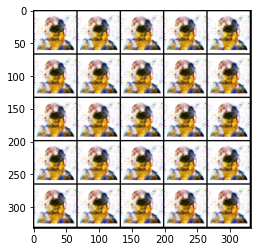

| Epoch: 1 |
| Epoch: 2 |
| Epoch: 3 |
| Epoch: 4 |
| Epoch: 005 | D_error: 0.031 | G_error: 5.697 | FID_score: 410.4534 | Time: 0m 21s


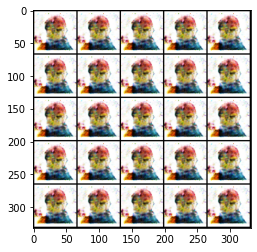

| Epoch: 6 |
| Epoch: 7 |
| Epoch: 8 |
| Epoch: 9 |
| Epoch: 010 | D_error: 0.018 | G_error: 4.926 | FID_score: 361.8820 | Time: 0m 21s


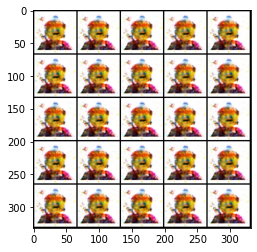

| Epoch: 11 |
| Epoch: 12 |
| Epoch: 13 |
| Epoch: 14 |
| Epoch: 015 | D_error: 0.030 | G_error: 6.273 | FID_score: 363.5122 | Time: 0m 21s


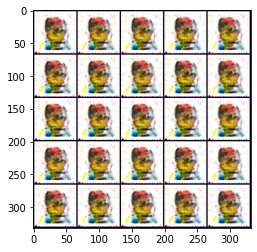

| Epoch: 16 |
| Epoch: 17 |
| Epoch: 18 |
| Epoch: 19 |
| Epoch: 020 | D_error: 0.257 | G_error: 3.913 | FID_score: 347.4947 | Time: 0m 22s


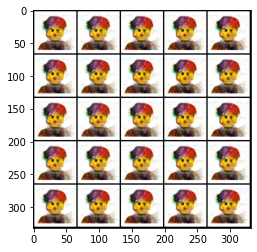

| Epoch: 21 |
| Epoch: 22 |
| Epoch: 23 |
| Epoch: 24 |
| Epoch: 025 | D_error: 0.007 | G_error: 6.392 | FID_score: 382.8848 | Time: 0m 22s


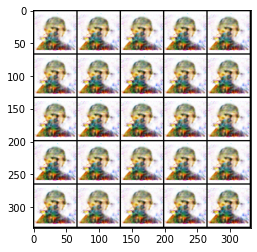

| Epoch: 26 |
| Epoch: 27 |
| Epoch: 28 |
| Epoch: 29 |
| Epoch: 030 | D_error: 0.001 | G_error: 8.112 | FID_score: 376.1767 | Time: 0m 22s


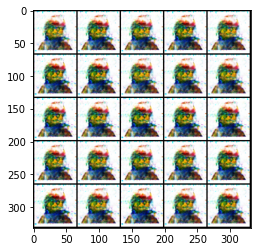

| Epoch: 31 |
| Epoch: 32 |
| Epoch: 33 |
| Epoch: 34 |
| Epoch: 035 | D_error: 0.012 | G_error: 7.223 | FID_score: 363.7679 | Time: 0m 21s


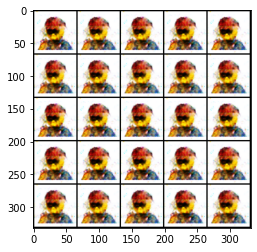

| Epoch: 36 |
| Epoch: 37 |
| Epoch: 38 |
| Epoch: 39 |
| Epoch: 040 | D_error: 0.035 | G_error: 4.843 | FID_score: 352.9488 | Time: 0m 22s


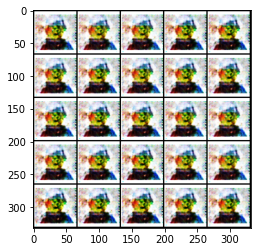

| Epoch: 41 |
| Epoch: 42 |
| Epoch: 43 |
| Epoch: 44 |
| Epoch: 045 | D_error: 0.025 | G_error: 6.015 | FID_score: 376.6444 | Time: 0m 21s


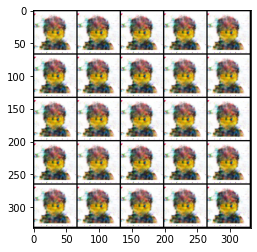

| Epoch: 46 |
| Epoch: 47 |
| Epoch: 48 |
| Epoch: 49 |
| Epoch: 050 | D_error: 0.019 | G_error: 6.414 | FID_score: 399.2082 | Time: 0m 22s


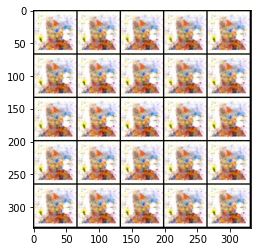

| Epoch: 51 |
| Epoch: 52 |
| Epoch: 53 |
| Epoch: 54 |
| Epoch: 055 | D_error: 0.046 | G_error: 7.361 | FID_score: 418.6474 | Time: 0m 21s


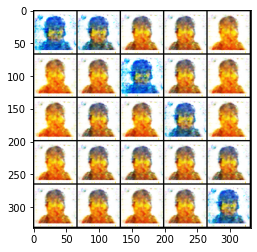

| Epoch: 56 |
| Epoch: 57 |
| Epoch: 58 |
| Epoch: 59 |
| Epoch: 060 | D_error: 0.790 | G_error: 10.314 | FID_score: 355.5671 | Time: 0m 22s


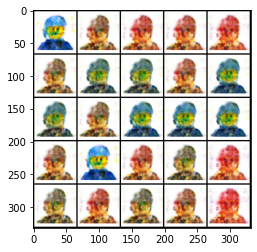

| Epoch: 61 |
| Epoch: 62 |
| Epoch: 63 |
| Epoch: 64 |
| Epoch: 065 | D_error: 0.112 | G_error: 10.135 | FID_score: 331.4713 | Time: 0m 22s


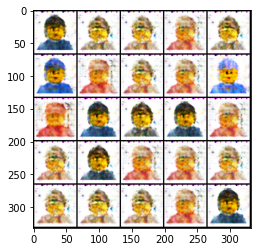

| Epoch: 66 |
| Epoch: 67 |
| Epoch: 68 |
| Epoch: 69 |
| Epoch: 070 | D_error: 0.154 | G_error: 11.630 | FID_score: 315.4936 | Time: 0m 22s


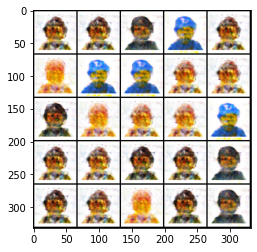

| Epoch: 71 |
| Epoch: 72 |
| Epoch: 73 |
| Epoch: 74 |
| Epoch: 075 | D_error: 0.201 | G_error: 2.949 | FID_score: 316.9148 | Time: 0m 21s


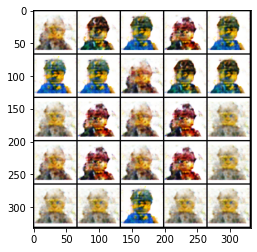

| Epoch: 76 |
| Epoch: 77 |
| Epoch: 78 |
| Epoch: 79 |
| Epoch: 080 | D_error: 0.189 | G_error: 4.045 | FID_score: 311.7541 | Time: 0m 21s


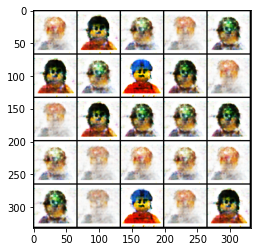

| Epoch: 81 |
| Epoch: 82 |
| Epoch: 83 |
| Epoch: 84 |
| Epoch: 085 | D_error: 0.120 | G_error: 4.501 | FID_score: 295.5828 | Time: 0m 21s


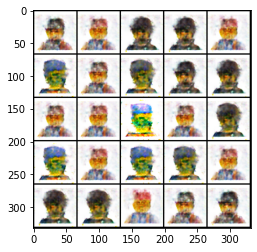

| Epoch: 86 |
| Epoch: 87 |
| Epoch: 88 |
| Epoch: 89 |
| Epoch: 090 | D_error: 0.073 | G_error: 3.912 | FID_score: 319.8099 | Time: 0m 21s


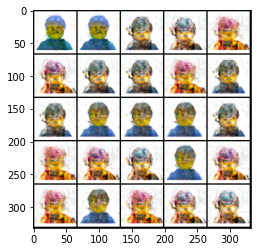

| Epoch: 91 |
| Epoch: 92 |
| Epoch: 93 |
| Epoch: 94 |
| Epoch: 095 | D_error: 0.307 | G_error: 8.873 | FID_score: 297.9649 | Time: 0m 21s


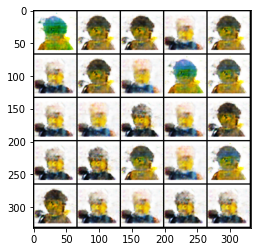

| Epoch: 96 |
| Epoch: 97 |
| Epoch: 98 |
| Epoch: 99 |
| Epoch: 100 | D_error: 1.189 | G_error: 4.770 | FID_score: 284.9111 | Time: 0m 21s


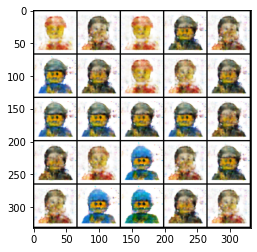

| Epoch: 101 |
| Epoch: 102 |
| Epoch: 103 |
| Epoch: 104 |
| Epoch: 105 | D_error: 0.044 | G_error: 5.814 | FID_score: 281.5262 | Time: 0m 21s


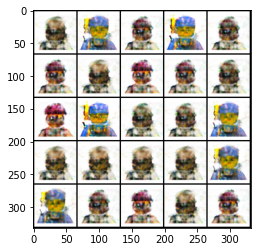

| Epoch: 106 |
| Epoch: 107 |
| Epoch: 108 |
| Epoch: 109 |
| Epoch: 110 | D_error: 0.129 | G_error: 4.451 | FID_score: 291.6467 | Time: 0m 22s


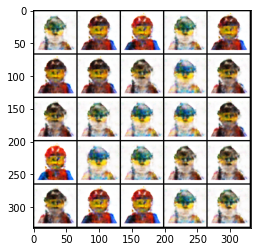

| Epoch: 111 |
| Epoch: 112 |
| Epoch: 113 |
| Epoch: 114 |
| Epoch: 115 | D_error: 0.400 | G_error: 11.406 | FID_score: 296.0861 | Time: 0m 21s


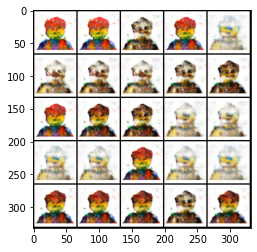

| Epoch: 116 |
| Epoch: 117 |
| Epoch: 118 |
| Epoch: 119 |
| Epoch: 120 | D_error: 0.066 | G_error: 5.721 | FID_score: 289.7168 | Time: 0m 21s


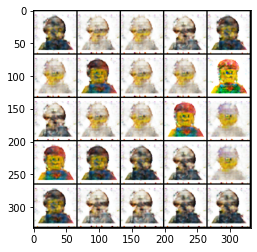

| Epoch: 121 |
| Epoch: 122 |
| Epoch: 123 |
| Epoch: 124 |
| Epoch: 125 | D_error: 0.017 | G_error: 6.948 | FID_score: 307.3148 | Time: 0m 21s


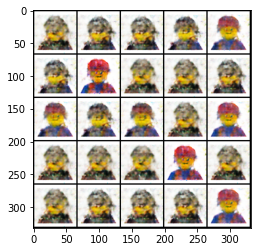

| Epoch: 126 |
| Epoch: 127 |
| Epoch: 128 |
| Epoch: 129 |
| Epoch: 130 | D_error: 0.087 | G_error: 4.911 | FID_score: 265.8660 | Time: 0m 21s


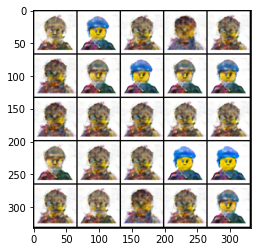

| Epoch: 131 |
| Epoch: 132 |
| Epoch: 133 |
| Epoch: 134 |
| Epoch: 135 | D_error: 0.197 | G_error: 2.347 | FID_score: 303.7439 | Time: 0m 21s


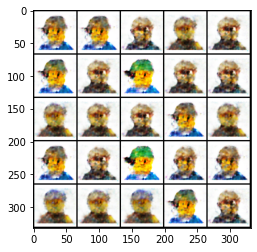

| Epoch: 136 |
| Epoch: 137 |
| Epoch: 138 |
| Epoch: 139 |
| Epoch: 140 | D_error: 0.015 | G_error: 7.743 | FID_score: 295.0771 | Time: 0m 21s


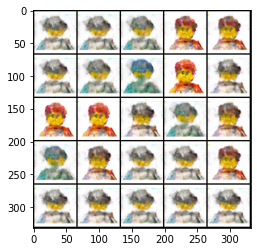

| Epoch: 141 |
| Epoch: 142 |
| Epoch: 143 |
| Epoch: 144 |
| Epoch: 145 | D_error: 0.058 | G_error: 5.341 | FID_score: 276.8388 | Time: 0m 21s


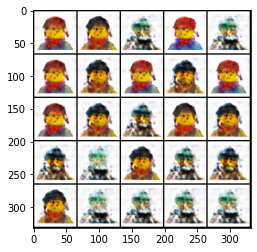

| Epoch: 146 |
| Epoch: 147 |
| Epoch: 148 |
| Epoch: 149 |
| Epoch: 150 | D_error: 0.158 | G_error: 4.564 | FID_score: 304.9598 | Time: 0m 21s


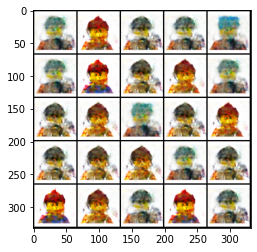

| Epoch: 151 |
| Epoch: 152 |
| Epoch: 153 |
| Epoch: 154 |
| Epoch: 155 | D_error: 0.171 | G_error: 3.688 | FID_score: 346.5205 | Time: 0m 21s


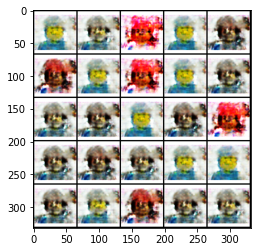

| Epoch: 156 |
| Epoch: 157 |
| Epoch: 158 |
| Epoch: 159 |
| Epoch: 160 | D_error: 0.207 | G_error: 3.558 | FID_score: 286.1194 | Time: 0m 21s


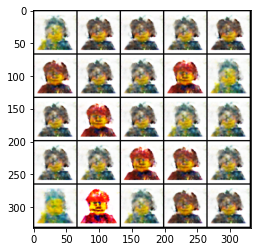

| Epoch: 161 |
| Epoch: 162 |
| Epoch: 163 |
| Epoch: 164 |
| Epoch: 165 | D_error: 0.037 | G_error: 5.414 | FID_score: 288.9557 | Time: 0m 21s


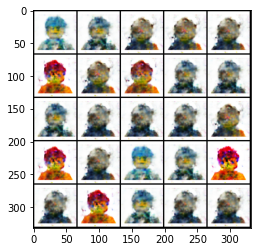

| Epoch: 166 |
| Epoch: 167 |
| Epoch: 168 |
| Epoch: 169 |
| Epoch: 170 | D_error: 0.076 | G_error: 4.274 | FID_score: 282.3842 | Time: 0m 21s


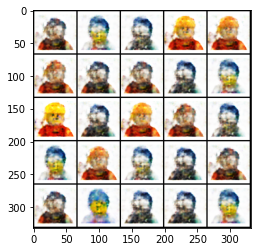

| Epoch: 171 |
| Epoch: 172 |
| Epoch: 173 |
| Epoch: 174 |
| Epoch: 175 | D_error: 0.103 | G_error: 3.979 | FID_score: 287.6974 | Time: 0m 21s


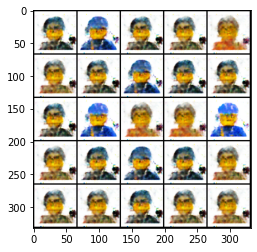

| Epoch: 176 |
| Epoch: 177 |
| Epoch: 178 |
| Epoch: 179 |
| Epoch: 180 | D_error: 0.036 | G_error: 4.931 | FID_score: 288.9078 | Time: 0m 20s


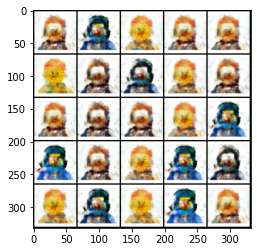

| Epoch: 181 |
| Epoch: 182 |
| Epoch: 183 |
| Epoch: 184 |
| Epoch: 185 | D_error: 0.117 | G_error: 5.239 | FID_score: 309.5533 | Time: 0m 21s


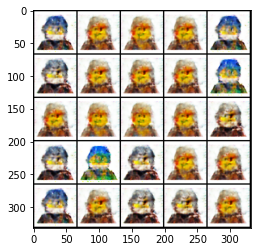

| Epoch: 186 |
| Epoch: 187 |
| Epoch: 188 |
| Epoch: 189 |
| Epoch: 190 | D_error: 0.035 | G_error: 6.374 | FID_score: 303.4010 | Time: 0m 21s


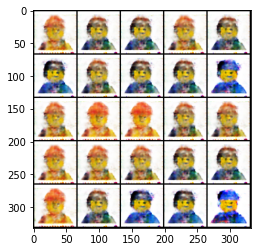

| Epoch: 191 |
| Epoch: 192 |
| Epoch: 193 |
| Epoch: 194 |
| Epoch: 195 | D_error: 0.033 | G_error: 5.399 | FID_score: 341.0921 | Time: 0m 21s


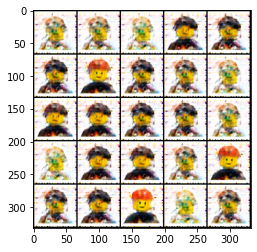

| Epoch: 196 |
| Epoch: 197 |
| Epoch: 198 |
| Epoch: 199 |
| Epoch: 200 | D_error: 0.016 | G_error: 12.231 | FID_score: 321.6003 | Time: 0m 21s


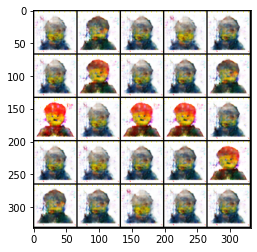

| Epoch: 201 |
| Epoch: 202 |
| Epoch: 203 |
| Epoch: 204 |
| Epoch: 205 | D_error: 0.054 | G_error: 5.016 | FID_score: 296.8320 | Time: 0m 21s


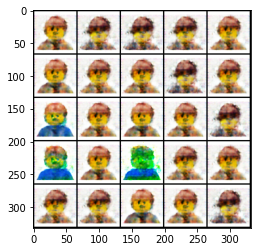

| Epoch: 206 |
| Epoch: 207 |
| Epoch: 208 |
| Epoch: 209 |
| Epoch: 210 | D_error: 0.058 | G_error: 3.985 | FID_score: 299.3366 | Time: 0m 21s


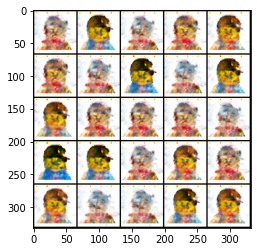

| Epoch: 211 |
| Epoch: 212 |
| Epoch: 213 |
| Epoch: 214 |
| Epoch: 215 | D_error: 0.069 | G_error: 5.446 | FID_score: 334.8696 | Time: 0m 21s


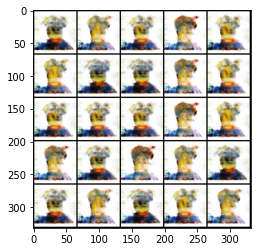

| Epoch: 216 |
| Epoch: 217 |
| Epoch: 218 |
| Epoch: 219 |
| Epoch: 220 | D_error: 0.027 | G_error: 4.813 | FID_score: 292.3568 | Time: 0m 21s


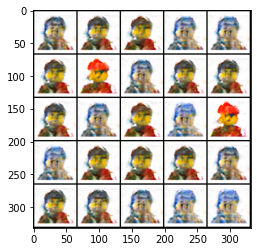

| Epoch: 221 |
| Epoch: 222 |
| Epoch: 223 |
| Epoch: 224 |
| Epoch: 225 | D_error: 0.301 | G_error: 2.119 | FID_score: 265.8292 | Time: 0m 21s


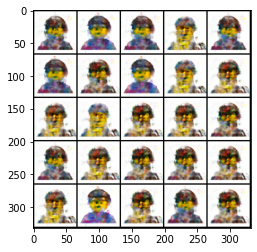

| Epoch: 226 |
| Epoch: 227 |
| Epoch: 228 |
| Epoch: 229 |
| Epoch: 230 | D_error: 0.020 | G_error: 4.400 | FID_score: 262.9493 | Time: 0m 21s


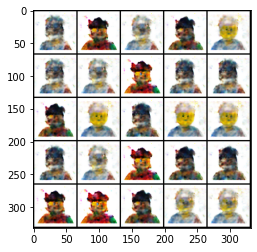

| Epoch: 231 |
| Epoch: 232 |
| Epoch: 233 |
| Epoch: 234 |
| Epoch: 235 | D_error: 0.035 | G_error: 6.733 | FID_score: 317.6170 | Time: 0m 21s


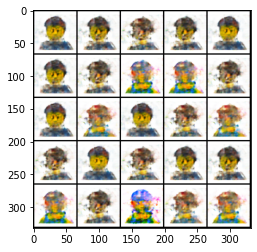

| Epoch: 236 |
| Epoch: 237 |
| Epoch: 238 |
| Epoch: 239 |
| Epoch: 240 | D_error: 0.022 | G_error: 5.460 | FID_score: 278.5181 | Time: 0m 21s


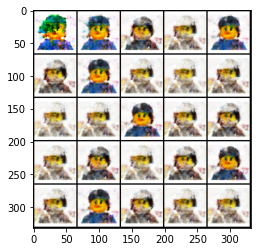

| Epoch: 241 |
| Epoch: 242 |
| Epoch: 243 |
| Epoch: 244 |
| Epoch: 245 | D_error: 0.032 | G_error: 4.840 | FID_score: 330.5885 | Time: 0m 21s


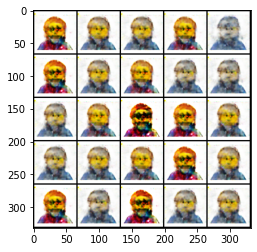

| Epoch: 246 |
| Epoch: 247 |
| Epoch: 248 |
| Epoch: 249 |
| Epoch: 250 | D_error: 0.075 | G_error: 6.329 | FID_score: 295.9288 | Time: 0m 21s


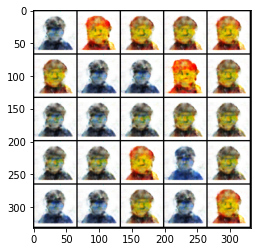

| Epoch: 251 |
| Epoch: 252 |
| Epoch: 253 |
| Epoch: 254 |
| Epoch: 255 | D_error: 0.047 | G_error: 6.932 | FID_score: 309.6571 | Time: 0m 21s


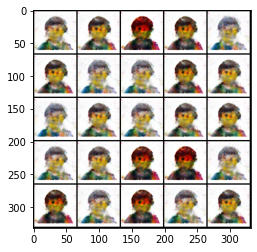

| Epoch: 256 |
| Epoch: 257 |
| Epoch: 258 |
| Epoch: 259 |
| Epoch: 260 | D_error: 0.092 | G_error: 3.755 | FID_score: 260.1843 | Time: 0m 21s


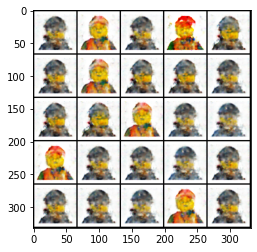

| Epoch: 261 |
| Epoch: 262 |
| Epoch: 263 |
| Epoch: 264 |
| Epoch: 265 | D_error: 0.079 | G_error: 5.641 | FID_score: 304.0720 | Time: 0m 20s


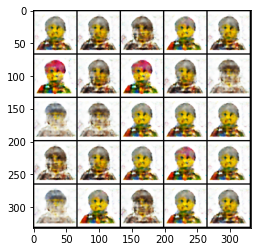

| Epoch: 266 |
| Epoch: 267 |
| Epoch: 268 |
| Epoch: 269 |
| Epoch: 270 | D_error: 0.132 | G_error: 4.978 | FID_score: 316.3942 | Time: 0m 21s


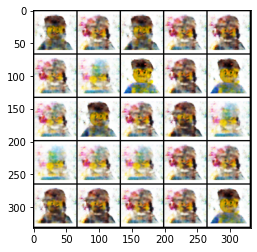

| Epoch: 271 |
| Epoch: 272 |
| Epoch: 273 |
| Epoch: 274 |
| Epoch: 275 | D_error: 0.194 | G_error: 7.617 | FID_score: 323.8709 | Time: 0m 21s


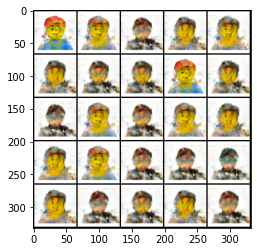

| Epoch: 276 |
| Epoch: 277 |
| Epoch: 278 |
| Epoch: 279 |
| Epoch: 280 | D_error: 0.032 | G_error: 2.172 | FID_score: 258.1100 | Time: 0m 21s


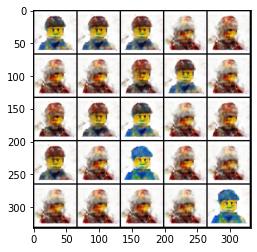

| Epoch: 281 |
| Epoch: 282 |
| Epoch: 283 |
| Epoch: 284 |
| Epoch: 285 | D_error: 0.073 | G_error: 5.637 | FID_score: 283.4831 | Time: 0m 21s


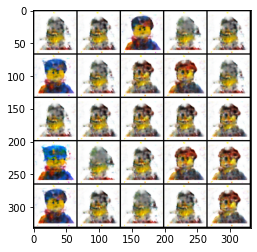

| Epoch: 286 |
| Epoch: 287 |
| Epoch: 288 |
| Epoch: 289 |
| Epoch: 290 | D_error: 0.260 | G_error: 7.131 | FID_score: 281.1182 | Time: 0m 21s


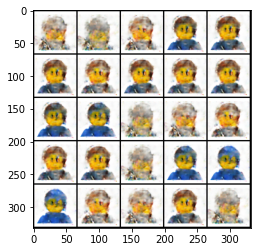

| Epoch: 291 |
| Epoch: 292 |
| Epoch: 293 |
| Epoch: 294 |
| Epoch: 295 | D_error: 0.187 | G_error: 3.384 | FID_score: 258.9756 | Time: 0m 21s


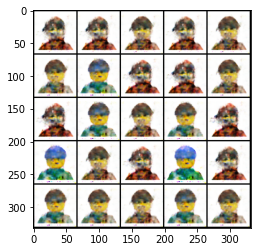

| Epoch: 296 |
| Epoch: 297 |
| Epoch: 298 |
| Epoch: 299 |
| Epoch: 300 | D_error: 0.154 | G_error: 6.783 | FID_score: 304.8184 | Time: 0m 21s


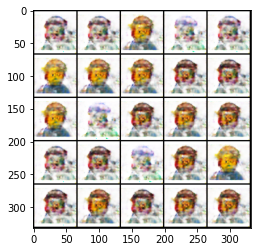

| Epoch: 301 |
| Epoch: 302 |
| Epoch: 303 |
| Epoch: 304 |
| Epoch: 305 | D_error: 0.003 | G_error: 6.194 | FID_score: 252.4444 | Time: 0m 21s


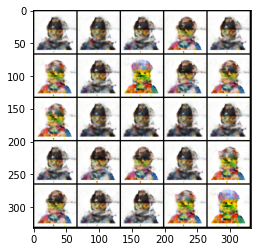

| Epoch: 306 |
| Epoch: 307 |
| Epoch: 308 |
| Epoch: 309 |
| Epoch: 310 | D_error: 0.092 | G_error: 6.353 | FID_score: 298.3727 | Time: 0m 21s


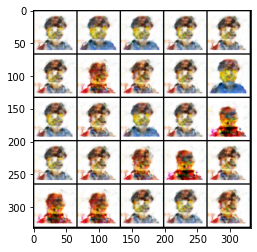

| Epoch: 311 |
| Epoch: 312 |
| Epoch: 313 |
| Epoch: 314 |
| Epoch: 315 | D_error: 0.013 | G_error: 8.297 | FID_score: 295.5552 | Time: 0m 21s


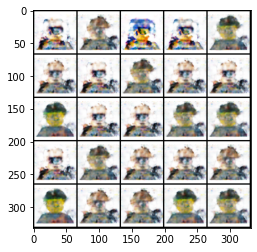

| Epoch: 316 |
| Epoch: 317 |
| Epoch: 318 |
| Epoch: 319 |
| Epoch: 320 | D_error: 0.041 | G_error: 4.828 | FID_score: 314.1373 | Time: 0m 21s


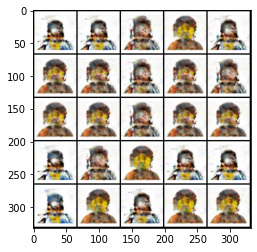

| Epoch: 321 |
| Epoch: 322 |
| Epoch: 323 |
| Epoch: 324 |
| Epoch: 325 | D_error: 0.098 | G_error: 6.250 | FID_score: 301.0048 | Time: 0m 21s


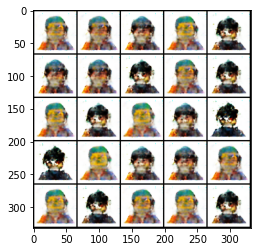

| Epoch: 326 |
| Epoch: 327 |
| Epoch: 328 |
| Epoch: 329 |
| Epoch: 330 | D_error: 0.005 | G_error: 6.096 | FID_score: 283.5422 | Time: 0m 21s


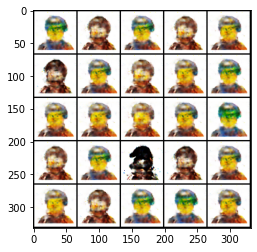

| Epoch: 331 |
| Epoch: 332 |
| Epoch: 333 |
| Epoch: 334 |
| Epoch: 335 | D_error: 0.397 | G_error: 1.549 | FID_score: 304.9212 | Time: 0m 21s


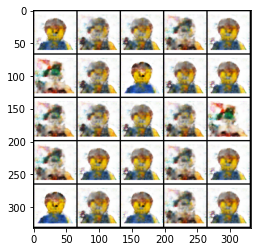

| Epoch: 336 |
| Epoch: 337 |
| Epoch: 338 |
| Epoch: 339 |
| Epoch: 340 | D_error: 0.227 | G_error: 2.135 | FID_score: 294.4979 | Time: 0m 21s


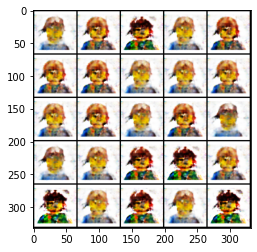

| Epoch: 341 |
| Epoch: 342 |
| Epoch: 343 |
| Epoch: 344 |
| Epoch: 345 | D_error: 0.036 | G_error: 5.252 | FID_score: 340.5095 | Time: 0m 21s


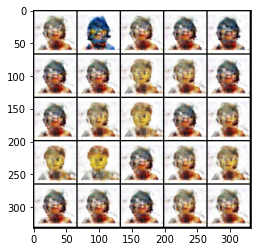

| Epoch: 346 |
| Epoch: 347 |
| Epoch: 348 |
| Epoch: 349 |
| Epoch: 350 | D_error: 0.019 | G_error: 7.587 | FID_score: 293.3488 | Time: 0m 21s


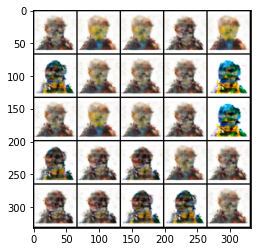

| Epoch: 351 |
| Epoch: 352 |
| Epoch: 353 |
| Epoch: 354 |
| Epoch: 355 | D_error: 0.154 | G_error: 4.620 | FID_score: 284.9088 | Time: 0m 21s


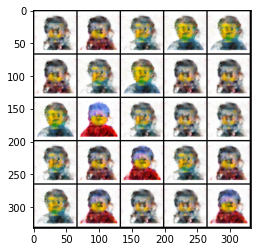

| Epoch: 356 |
| Epoch: 357 |
| Epoch: 358 |
| Epoch: 359 |
| Epoch: 360 | D_error: 0.015 | G_error: 4.643 | FID_score: 286.5197 | Time: 0m 21s


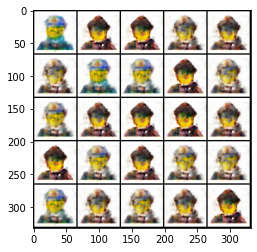

| Epoch: 361 |
| Epoch: 362 |
| Epoch: 363 |
| Epoch: 364 |
| Epoch: 365 | D_error: 0.215 | G_error: 15.432 | FID_score: 298.6800 | Time: 0m 21s


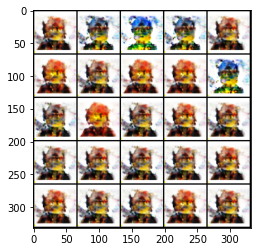

| Epoch: 366 |
| Epoch: 367 |
| Epoch: 368 |
| Epoch: 369 |
| Epoch: 370 | D_error: 0.213 | G_error: 7.978 | FID_score: 304.4617 | Time: 0m 21s


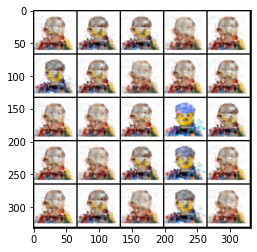

| Epoch: 371 |
| Epoch: 372 |
| Epoch: 373 |
| Epoch: 374 |
| Epoch: 375 | D_error: 0.007 | G_error: 6.924 | FID_score: 288.6196 | Time: 0m 21s


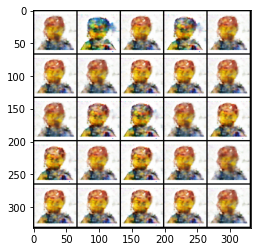

| Epoch: 376 |
| Epoch: 377 |
| Epoch: 378 |
| Epoch: 379 |
| Epoch: 380 | D_error: 0.009 | G_error: 5.875 | FID_score: 378.0620 | Time: 0m 21s


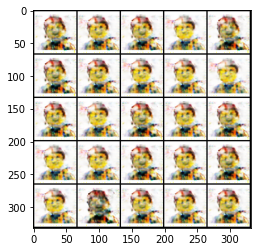

| Epoch: 381 |
| Epoch: 382 |
| Epoch: 383 |
| Epoch: 384 |
| Epoch: 385 | D_error: 0.005 | G_error: 6.597 | FID_score: 322.2346 | Time: 0m 22s


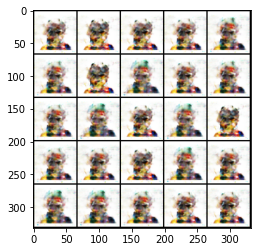

| Epoch: 386 |
| Epoch: 387 |
| Epoch: 388 |
| Epoch: 389 |
| Epoch: 390 | D_error: 0.002 | G_error: 10.982 | FID_score: 341.2225 | Time: 0m 21s


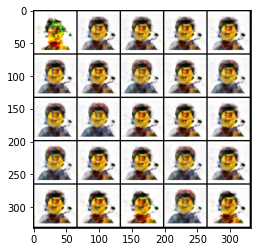

| Epoch: 391 |
| Epoch: 392 |
| Epoch: 393 |
| Epoch: 394 |
| Epoch: 395 | D_error: 0.095 | G_error: 5.549 | FID_score: 278.4256 | Time: 0m 21s


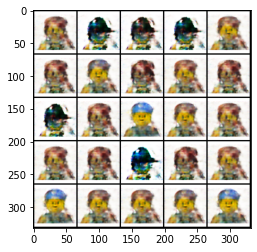

| Epoch: 396 |
| Epoch: 397 |
| Epoch: 398 |
| Epoch: 399 |
| Epoch: 400 | D_error: 0.009 | G_error: 8.236 | FID_score: 305.4483 | Time: 0m 21s


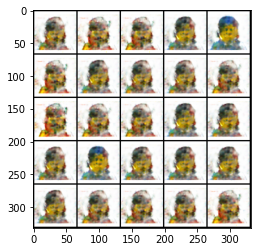

| Epoch: 401 |
| Epoch: 402 |
| Epoch: 403 |
| Epoch: 404 |
| Epoch: 405 | D_error: 0.001 | G_error: 9.895 | FID_score: 305.7400 | Time: 0m 21s


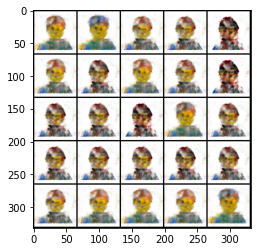

| Epoch: 406 |
| Epoch: 407 |
| Epoch: 408 |
| Epoch: 409 |
| Epoch: 410 | D_error: 0.020 | G_error: 6.007 | FID_score: 276.5994 | Time: 0m 21s


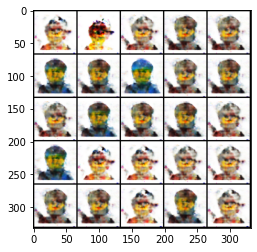

| Epoch: 411 |
| Epoch: 412 |
| Epoch: 413 |
| Epoch: 414 |
| Epoch: 415 | D_error: 0.023 | G_error: 3.049 | FID_score: 269.9624 | Time: 0m 21s


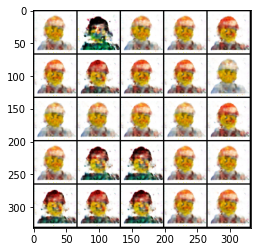

| Epoch: 416 |
| Epoch: 417 |
| Epoch: 418 |
| Epoch: 419 |
| Epoch: 420 | D_error: 0.119 | G_error: 6.038 | FID_score: 295.2855 | Time: 0m 23s


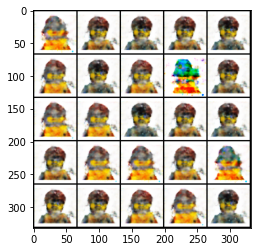

| Epoch: 421 |
| Epoch: 422 |
| Epoch: 423 |
| Epoch: 424 |
| Epoch: 425 | D_error: 0.057 | G_error: 5.523 | FID_score: 295.7095 | Time: 0m 21s


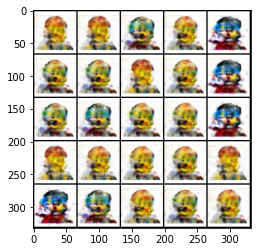

| Epoch: 426 |
| Epoch: 427 |
| Epoch: 428 |
| Epoch: 429 |
| Epoch: 430 | D_error: 0.737 | G_error: 2.966 | FID_score: 256.7014 | Time: 0m 21s


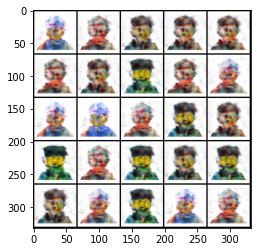

| Epoch: 431 |
| Epoch: 432 |
| Epoch: 433 |
| Epoch: 434 |
| Epoch: 435 | D_error: 0.060 | G_error: 5.837 | FID_score: 270.5535 | Time: 0m 20s


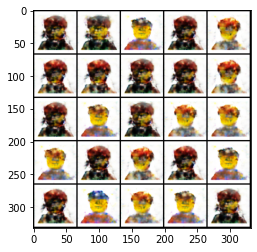

| Epoch: 436 |
| Epoch: 437 |
| Epoch: 438 |
| Epoch: 439 |
| Epoch: 440 | D_error: 0.087 | G_error: 4.099 | FID_score: 299.9434 | Time: 0m 21s


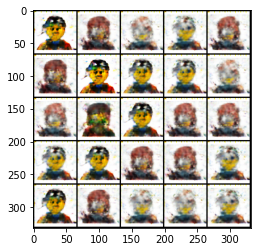

| Epoch: 441 |
| Epoch: 442 |
| Epoch: 443 |
| Epoch: 444 |
| Epoch: 445 | D_error: 0.006 | G_error: 7.098 | FID_score: 321.9736 | Time: 0m 21s


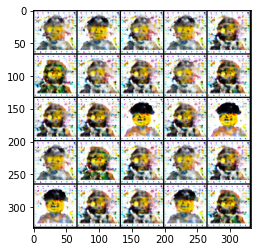

| Epoch: 446 |
| Epoch: 447 |
| Epoch: 448 |
| Epoch: 449 |
| Epoch: 450 | D_error: 0.015 | G_error: 6.304 | FID_score: 309.2673 | Time: 0m 21s


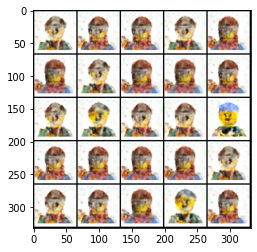

| Epoch: 451 |
| Epoch: 452 |
| Epoch: 453 |
| Epoch: 454 |
| Epoch: 455 | D_error: 0.506 | G_error: 16.504 | FID_score: 299.5778 | Time: 0m 20s


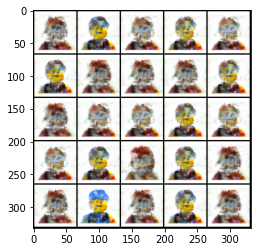

| Epoch: 456 |
| Epoch: 457 |
| Epoch: 458 |
| Epoch: 459 |
| Epoch: 460 | D_error: 0.043 | G_error: 5.285 | FID_score: 282.6526 | Time: 0m 20s


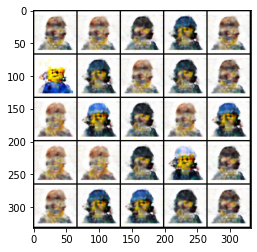

| Epoch: 461 |
| Epoch: 462 |
| Epoch: 463 |
| Epoch: 464 |
| Epoch: 465 | D_error: 0.010 | G_error: 4.819 | FID_score: 296.9844 | Time: 0m 20s


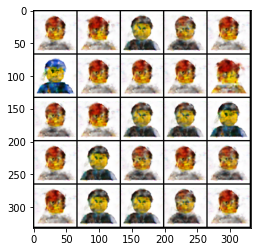

| Epoch: 466 |
| Epoch: 467 |
| Epoch: 468 |
| Epoch: 469 |
| Epoch: 470 | D_error: 0.065 | G_error: 5.429 | FID_score: 272.7794 | Time: 0m 21s


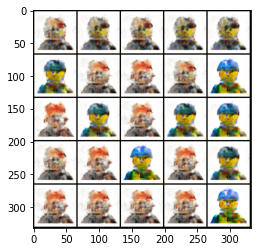

| Epoch: 471 |
| Epoch: 472 |
| Epoch: 473 |
| Epoch: 474 |
| Epoch: 475 | D_error: 0.076 | G_error: 5.765 | FID_score: 335.6154 | Time: 0m 20s


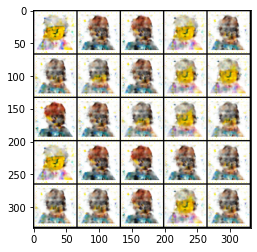

| Epoch: 476 |
| Epoch: 477 |
| Epoch: 478 |
| Epoch: 479 |
| Epoch: 480 | D_error: 0.047 | G_error: 9.582 | FID_score: 358.4128 | Time: 0m 20s


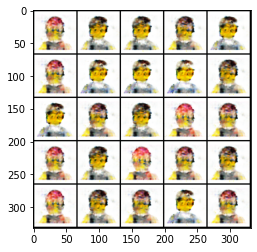

| Epoch: 481 |
| Epoch: 482 |
| Epoch: 483 |
| Epoch: 484 |
| Epoch: 485 | D_error: 0.007 | G_error: 6.108 | FID_score: 309.2759 | Time: 0m 21s


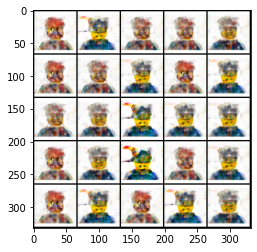

| Epoch: 486 |
| Epoch: 487 |
| Epoch: 488 |
| Epoch: 489 |
| Epoch: 490 | D_error: 0.108 | G_error: 3.015 | FID_score: 278.5864 | Time: 0m 20s


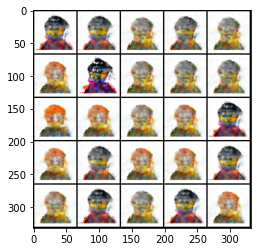

| Epoch: 491 |
| Epoch: 492 |
| Epoch: 493 |
| Epoch: 494 |
| Epoch: 495 | D_error: 0.022 | G_error: 4.511 | FID_score: 302.5825 | Time: 0m 20s


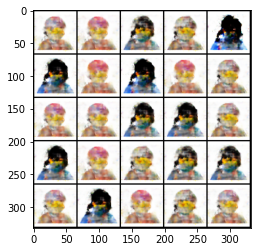

| Epoch: 496 |
| Epoch: 497 |
| Epoch: 498 |
| Epoch: 499 |


In [57]:
G_losses = []
D_losses = []

for epoch in range(0, N_EPOCHS):

    start_time = time.time()
    if epoch % 5 != 0:
        print('| Epoch: '+str(epoch)+' |')
        
    for i, data in enumerate(dataloader, 0):

        #=====================#
        # TRAIN DISCRIMINATOR #
        #=====================#
        
        #zero discriminator gradients
        D.zero_grad()
        
        #get batch of real images
        x  = data[0].to(device)
        
        #sample noise
        z = torch.randn(x.shape[0], LATENT_DIM).to(device)
        
        #get lego_label
        lego_label = data[1].to(device)
        
        real_labels = torch.full((x.size(0),), real_label, device=device).float()
        
        #generate images
        with torch.no_grad():
            generated_images = G(z, lego_label)
            
        #put real images through discriminator
        pred_real = D(x, lego_label)
        
        #how well does the discriminator detect real images?
        D_error_real = criterion(pred_real, real_labels)
        
        #put fake images through the discriminator
        #need to detach so don't backpropagate through generator
        pred_fake = D(generated_images.detach(), lego_label)
        
        fake_labels = torch.full((x.size(0),), fake_label, device=device).float()
        
        #how well does the discriminator detect fake images?
        D_error_fake = criterion(pred_fake, fake_labels)
        
        #get discriminator error
        D_error = D_error_real + D_error_fake

        #backpropagate errors to get gradients
        D_error.backward()
        
        #use gradient to update discriminator parameters
        D_optimizer.step()
        
        #=================#
        # TRAIN GENERATOR #
        #=================#
        
        #zero generator gradients
        G.zero_grad()
        
        #get batch of real images
        x  = data[0].to(device)
        
        #sample noise
        z = torch.randn(x.shape[0], LATENT_DIM).to(device)
        
        #generate images
        generated_images = G(z, lego_label)
        
        #put fake images through the discriminator
        pred_fake = D(generated_images, lego_label)
        
        #how well does the generator fool the discriminator?
        G_error = criterion(pred_fake, real_labels)
        
        #backpropagate errors to get gradients
        G_error.backward()
        
        #use gradient to update generator parameters
        G_optimizer.step()
        
    # Save Losses for plotting later
    G_losses.append(G_error.item())
    D_losses.append(D_error.item())
    fretchet_dist=calculate_fretchet(x, generated_images, model)
        
    end_time = time.time()
    
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
        
    if (epoch % 5) == 0:
    
        #sample noise
        z = torch.randn(5*5, LATENT_DIM).to(device)
        lego_label = torch.zeros(5*5, 4).to(device)
        
        #generate images
        with torch.no_grad():
            generated_images = G(z, lego_label)
    
        print(f'| Epoch: {epoch:03} | D_error: {D_error.item():.03f} | G_error: {G_error.item():.03f} | FID_score: {fretchet_dist:.04f} | Time: {epoch_mins}m {epoch_secs}s')
        
        #save 25 images
        torchvision.utils.save_image(generated_images, 
                                     f'output/epoch{epoch:03}.png', 
                                     nrow=5,
                                     normalize=True)
        
        #display images
        img = plt.imread(f'output/epoch{epoch:03}.png')
        plt.imshow(img)
        plt.show()

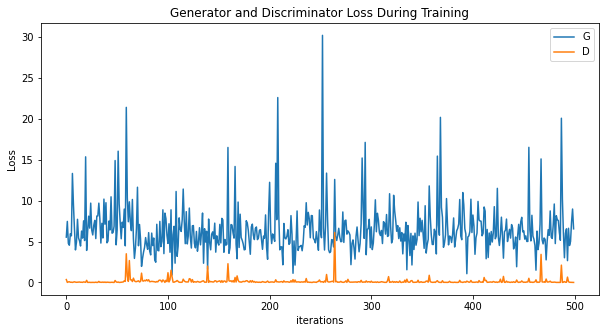

In [59]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()